## Instalar librerias

In [ ]:
! pip install --upgrade diffusers transformers torch accelerate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.1/290.1 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 2.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 2.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import os
import torch
from PIL import Image

import warnings
warnings.filterwarnings('ignore')

In [ ]:
OUTPUT_DIR = 'lab_1_generated_outputs/'

if not os.path.isdir(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

In [ ]:
# Model parameters ----------------------------------------
MODEL_ID = "runwayml/stable-diffusion-v1-5"
# MODEL_ID = "CompVis/stable-diffusion-v1-4"

# GPU parameters  ----------------------------------------
DEVICE = "cuda"
#"cuda"  # Use cuda to run on GPU

# Scheduler parameters ----------------------------------------
SCHEDULER = "EULER_ANCESTRAL"  # Choose from ["EULER_ANCESTRAL", "EULER", "DDIMS", "K-LMS", "PNDM"]
BETA_END = 0.012
BETA_SCHEDULE = "scaled_linear"
BETA_START = 0.00085

In [ ]:
from diffusers import (
    StableDiffusionPipeline,
    DDIMScheduler,
    LMSDiscreteScheduler,
    PNDMScheduler,
    EulerDiscreteScheduler,
    EulerAncestralDiscreteScheduler,
)

def create_pipeline(model_path):

    SCHEDULER_MAP = {
        "DDIMS": DDIMScheduler,
        "EULER_ANCESTRAL": EulerAncestralDiscreteScheduler,
        "EULER": EulerDiscreteScheduler,
        "K-LMS": LMSDiscreteScheduler,
        "PNDM": PNDMScheduler,
    }

    scheduler = SCHEDULER_MAP[SCHEDULER](
        beta_start=BETA_START,
        beta_end=BETA_END,
        beta_schedule=BETA_SCHEDULE,
        # num_train_timesteps=NUM_TRAIN_STEPS,
    )

    pipe = StableDiffusionPipeline.from_pretrained(
        model_path,
        scheduler=scheduler,
        torch_dtype=torch.float16,
        revision="fp16",
        # safety_checker=None,
    ).to(DEVICE)

    return pipe

The cache for model files in Transformers v4.22.0 has been updated. Migrating your old cache. This is a one-time only operation. You can interrupt this and resume the migration later on by calling `transformers.utils.move_cache()`.


0it [00:00, ?it/s]

In [ ]:
from diffusers import (
    StableDiffusionPipeline,
    DDIMScheduler,
    LMSDiscreteScheduler,
    PNDMScheduler,
    EulerDiscreteScheduler,
    EulerAncestralDiscreteScheduler,
)

def create_pipeline(model_path):

    SCHEDULER_MAP = {
        "DDIMS": DDIMScheduler,
        "EULER_ANCESTRAL": EulerAncestralDiscreteScheduler,
        "EULER": EulerDiscreteScheduler,
        "K-LMS": LMSDiscreteScheduler,
        "PNDM": PNDMScheduler,
    }

    scheduler = SCHEDULER_MAP[SCHEDULER](
        beta_start=BETA_START,
        beta_end=BETA_END,
        beta_schedule=BETA_SCHEDULE,
        # num_train_timesteps=NUM_TRAIN_STEPS,
    )

    pipe = StableDiffusionPipeline.from_pretrained(
        model_path,
        scheduler=scheduler,
        torch_dtype=torch.float16,
        revision="fp16",
        # safety_checker=None,
    ).to(DEVICE)

    return pipe

In [ ]:
INFERENCE_SEED = 1122334455
pipe = create_pipeline(model_path=MODEL_ID)
# Set seed
custom_generator = torch.Generator(device='cuda').manual_seed(INFERENCE_SEED)
def generate_image(pipe, prompt, escena, steps=80, h=512, w=512, guidance_scale=7, strength=0.75, seed=custom_generator, save_image=True):
    print(prompt)
    image = pipe(prompt, num_inference_steps=steps, height=h, width=w, guidance_scale=guidance_scale, strength=strength, generator=seed)["images"][0]
    display(image)
    if save_image == True:
        outfilename = f'{OUTPUT_DIR}/{escena}_{INFERENCE_SEED}_1_' + prompt.replace(' ', '_') + '.png'
        image.save(outfilename)
    return guidance_scale , steps , strength

model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

unet/diffusion_pytorch_model.safetensors not found


Fetching 14 files:   0%|          | 0/14 [00:00<?, ?it/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/636 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

safety_checker/config.json:   0%|          | 0.00/4.70k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/608M [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/609 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/822 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/246M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/167M [00:00<?, ?B/s]

diffusion_pytorch_model.bin:   0%|          | 0.00/1.72G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

IA robot working in rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

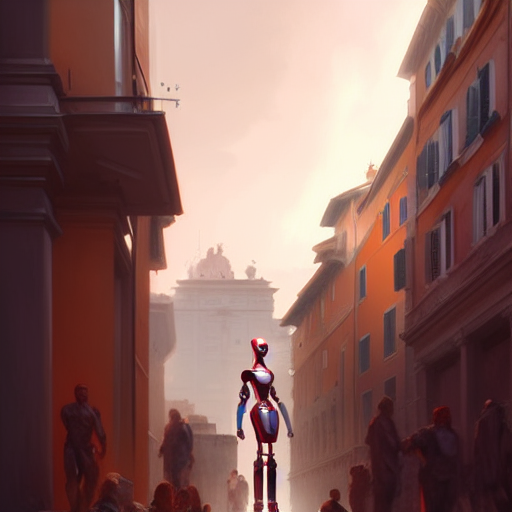

INFERENCE_SEED :  0 guidance_scale :  13 steps :  80 strength :  0.75
IA robot working in rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

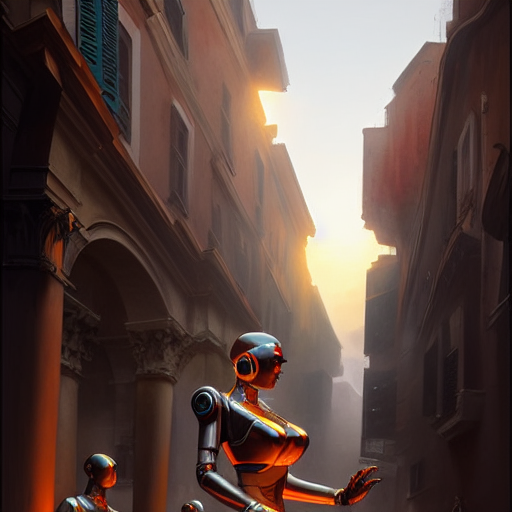

INFERENCE_SEED :  1 guidance_scale :  13 steps :  80 strength :  0.75
IA robot working in rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

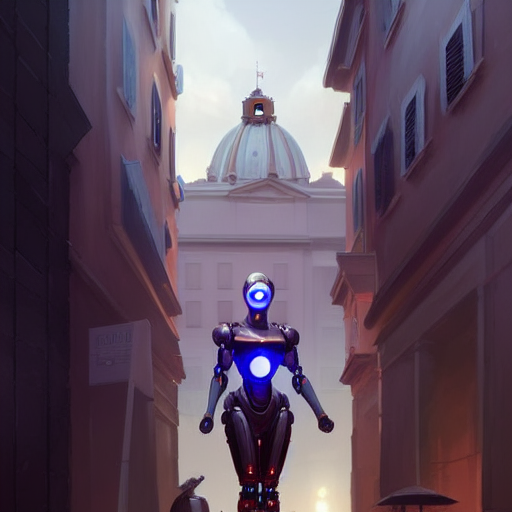

INFERENCE_SEED :  2 guidance_scale :  13 steps :  80 strength :  0.75
IA robot working in rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

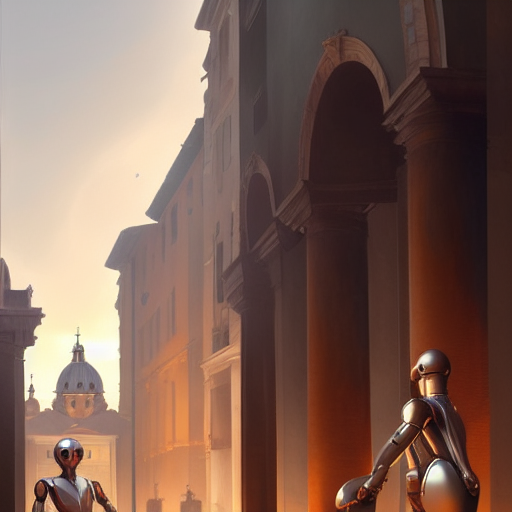

INFERENCE_SEED :  3 guidance_scale :  13 steps :  80 strength :  0.75
IA robot working in rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

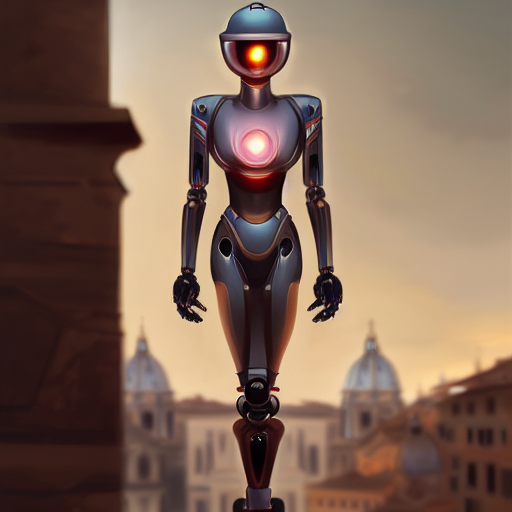

INFERENCE_SEED :  4 guidance_scale :  13 steps :  80 strength :  0.75


In [ ]:
for i in range (5):
    INFERENCE_SEED = i
    custom_generator = torch.Generator(device='cuda').manual_seed(INFERENCE_SEED)
    prompt = "IA robot working in rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski"
    guidance_scale = 13
    steps = 80
    strength = 0.75
    generate_image(pipe, prompt,guidance_scale= guidance_scale, steps= steps, seed=custom_generator, strength= strength , escena = "0. Marco" ,save_image=False)
    print("INFERENCE_SEED : ",INFERENCE_SEED,"guidance_scale : ",guidance_scale,"steps : ", steps, "strength : ", strength)

IA robot destroying Rome with fire,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

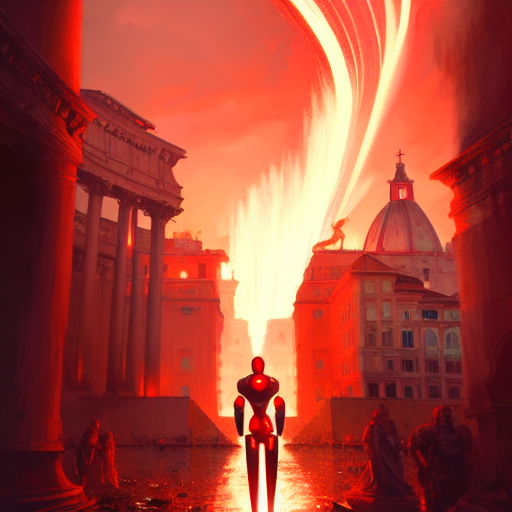

INFERENCE_SEED :  0 guidance_scale :  13 steps :  80 strength :  0.75
IA robot destroying Rome with fire,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

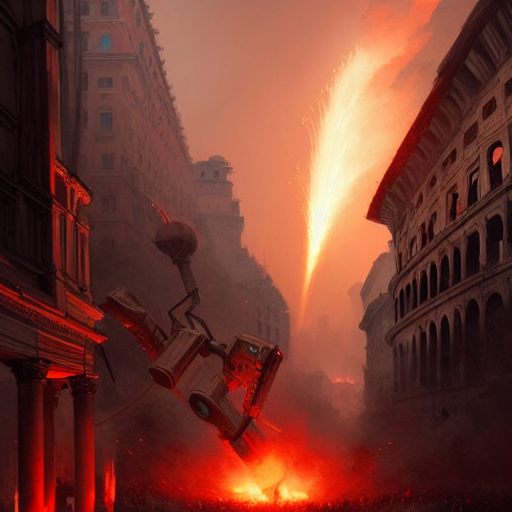

INFERENCE_SEED :  1 guidance_scale :  13 steps :  80 strength :  0.75
IA robot destroying Rome with fire,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

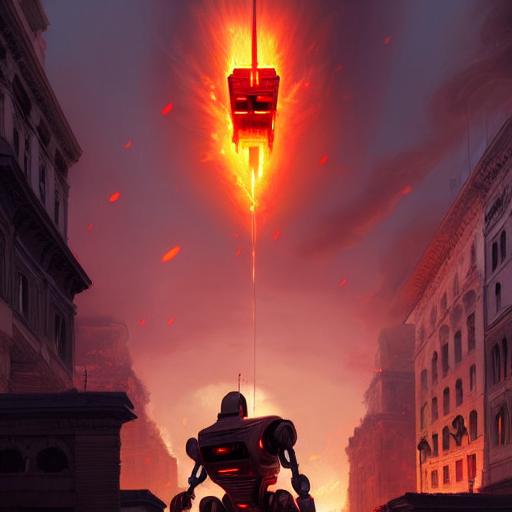

INFERENCE_SEED :  2 guidance_scale :  13 steps :  80 strength :  0.75
IA robot destroying Rome with fire,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

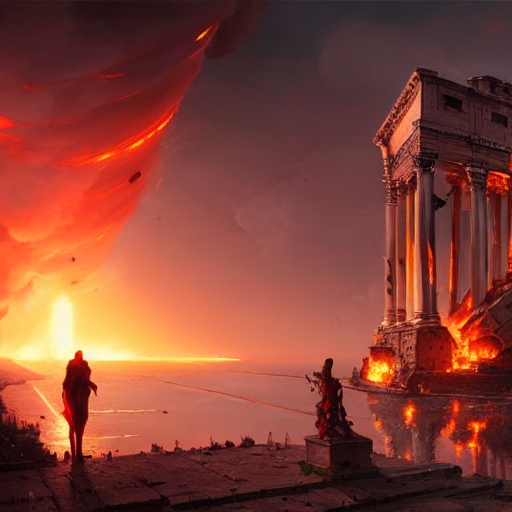

INFERENCE_SEED :  3 guidance_scale :  13 steps :  80 strength :  0.75
IA robot destroying Rome with fire,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

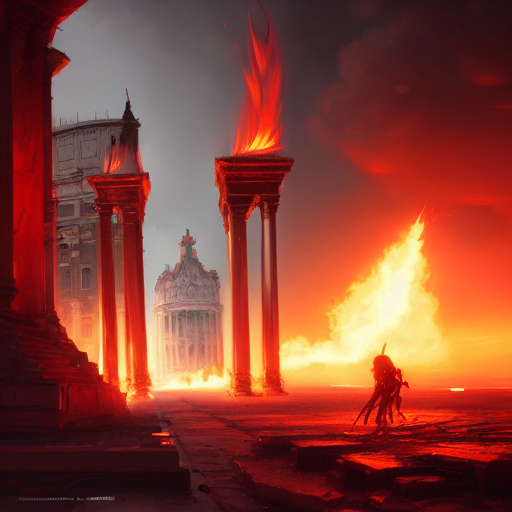

INFERENCE_SEED :  4 guidance_scale :  13 steps :  80 strength :  0.75


In [ ]:
for i in range (5):
    INFERENCE_SEED = i
    custom_generator = torch.Generator(device='cuda').manual_seed(INFERENCE_SEED)
    prompt = "IA robot destroying Rome with fire,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski"
    guidance_scale = 13
    steps = 80
    strength = 0.75
    generate_image(pipe, prompt,guidance_scale= guidance_scale, steps= steps, seed=custom_generator, strength= strength , escena = "0. Marco" ,save_image=False)
    print("INFERENCE_SEED : ",INFERENCE_SEED,"guidance_scale : ",guidance_scale,"steps : ", steps, "strength : ", strength)

Marco Aurelio, kian and IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

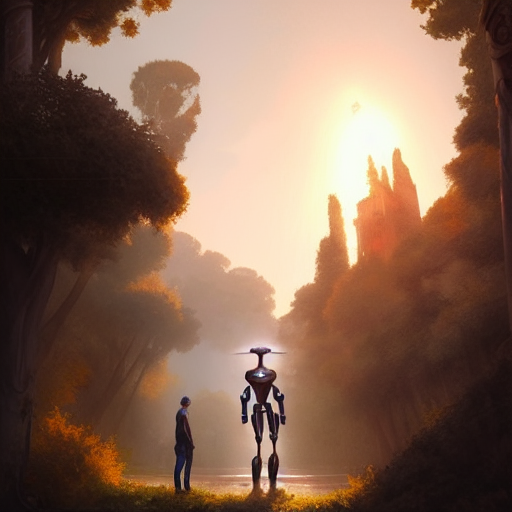

INFERENCE_SEED :  0 guidance_scale :  13 steps :  80 strength :  0.75
Marco Aurelio, kian and IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

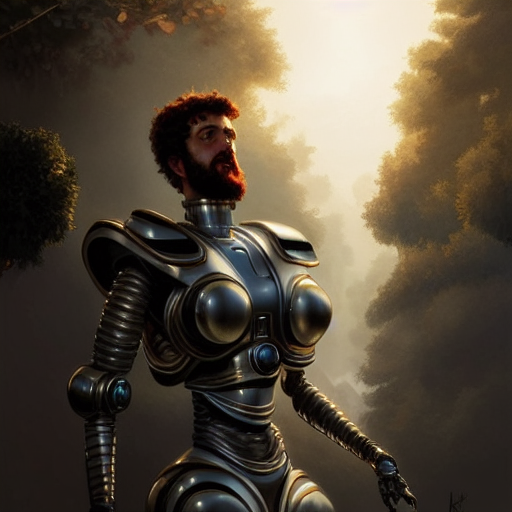

INFERENCE_SEED :  1 guidance_scale :  13 steps :  80 strength :  0.75
Marco Aurelio, kian and IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

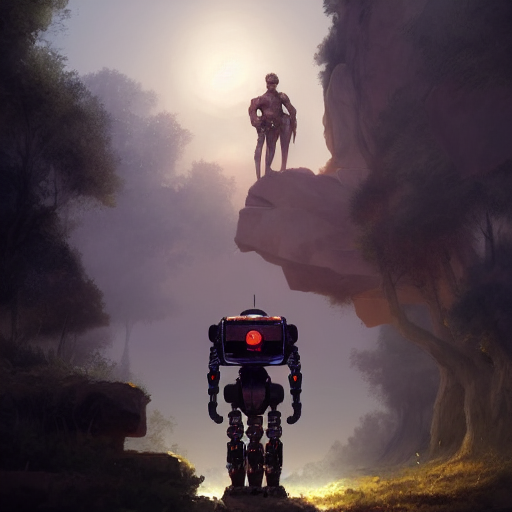

INFERENCE_SEED :  2 guidance_scale :  13 steps :  80 strength :  0.75
Marco Aurelio, kian and IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

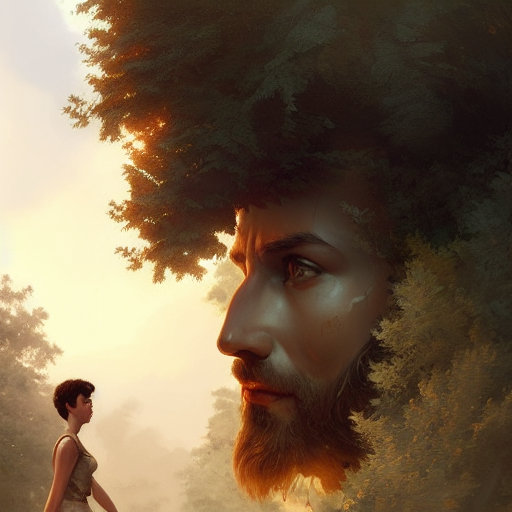

INFERENCE_SEED :  3 guidance_scale :  13 steps :  80 strength :  0.75
Marco Aurelio, kian and IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

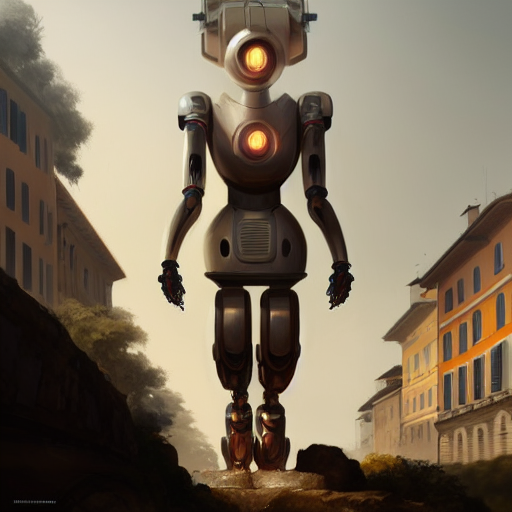

INFERENCE_SEED :  4 guidance_scale :  13 steps :  80 strength :  0.75


In [ ]:
for i in range (5):
    INFERENCE_SEED = i
    custom_generator = torch.Generator(device='cuda').manual_seed(INFERENCE_SEED)
    prompt = "Marco Aurelio, kian and IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski"
    guidance_scale = 13
    steps = 80
    strength = 0.75
    generate_image(pipe, prompt,guidance_scale= guidance_scale, steps= steps, seed=custom_generator, strength= strength , escena = "0. Marco" ,save_image=False)
    print("INFERENCE_SEED : ",INFERENCE_SEED,"guidance_scale : ",guidance_scale,"steps : ", steps, "strength : ", strength)

Marco Aurelio, one Kid, and one IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

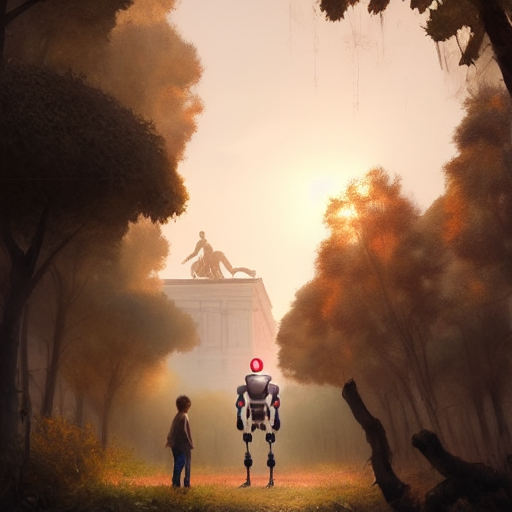

INFERENCE_SEED :  0 guidance_scale :  13 steps :  80 strength :  0.75
Marco Aurelio, one Kid, and one IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

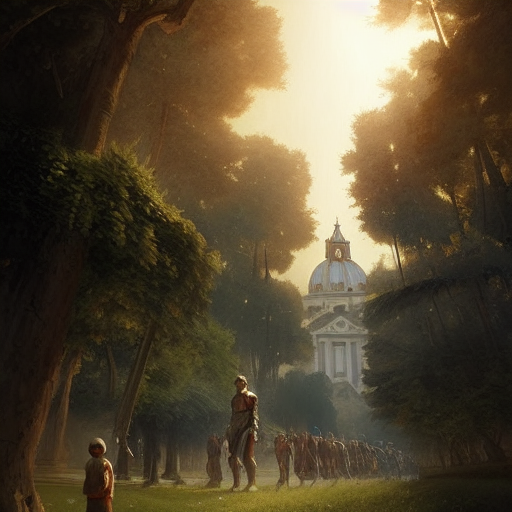

INFERENCE_SEED :  1 guidance_scale :  13 steps :  80 strength :  0.75
Marco Aurelio, one Kid, and one IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

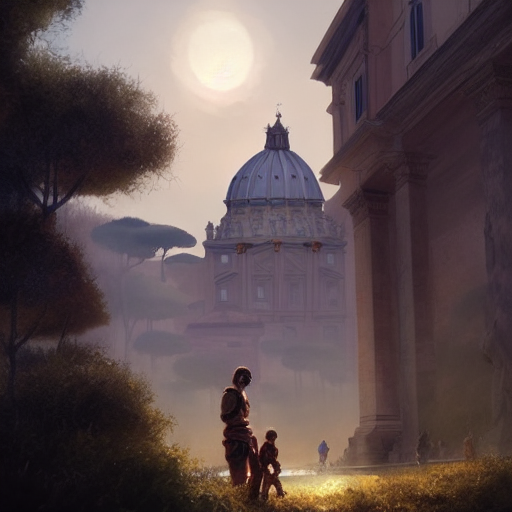

INFERENCE_SEED :  2 guidance_scale :  13 steps :  80 strength :  0.75
Marco Aurelio, one Kid, and one IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

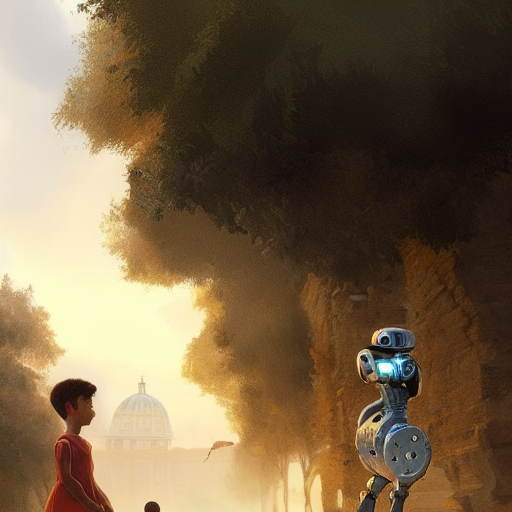

INFERENCE_SEED :  3 guidance_scale :  13 steps :  80 strength :  0.75
Marco Aurelio, one Kid, and one IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

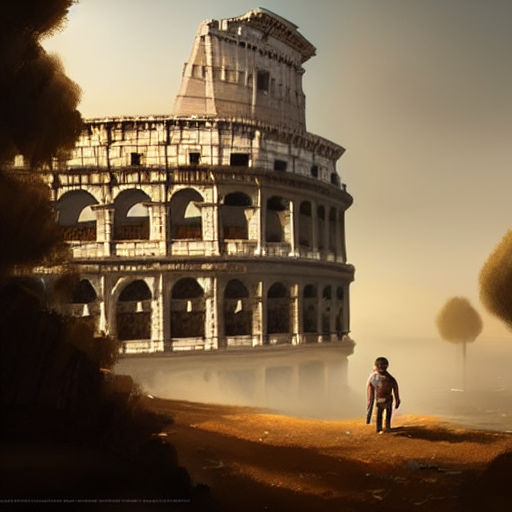

INFERENCE_SEED :  4 guidance_scale :  13 steps :  80 strength :  0.75


In [ ]:
for i in range (5):
    INFERENCE_SEED = i
    custom_generator = torch.Generator(device='cuda').manual_seed(INFERENCE_SEED)
    prompt = "Marco Aurelio, one Kid, and one IA robot in Rome nature,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski"
    guidance_scale = 13
    steps = 80
    strength = 0.75
    generate_image(pipe, prompt,guidance_scale= guidance_scale, steps= steps, seed=custom_generator, strength= strength , escena = "0. Marco" ,save_image=False)
    print("INFERENCE_SEED : ",INFERENCE_SEED,"guidance_scale : ",guidance_scale,"steps : ", steps, "strength : ", strength)

one Kid, and one IA robot working an happy in Rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

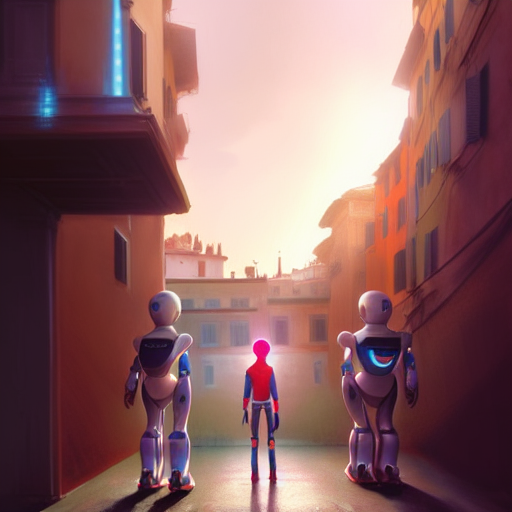

INFERENCE_SEED :  0 guidance_scale :  13 steps :  80 strength :  0.75
one Kid, and one IA robot working an happy in Rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

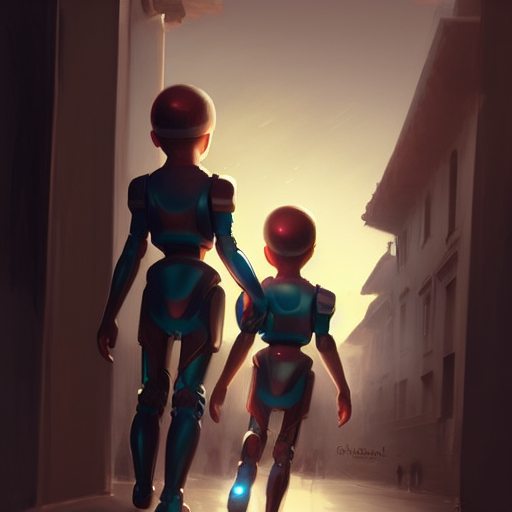

INFERENCE_SEED :  1 guidance_scale :  13 steps :  80 strength :  0.75
one Kid, and one IA robot working an happy in Rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

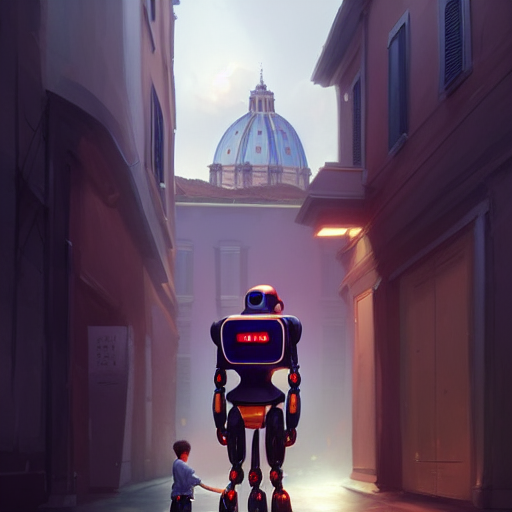

INFERENCE_SEED :  2 guidance_scale :  13 steps :  80 strength :  0.75
one Kid, and one IA robot working an happy in Rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

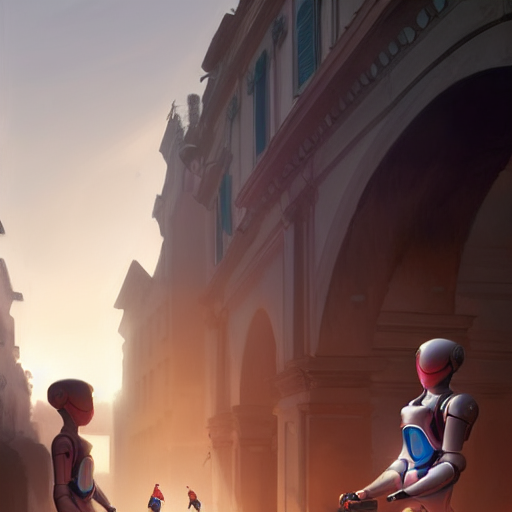

INFERENCE_SEED :  3 guidance_scale :  13 steps :  80 strength :  0.75
one Kid, and one IA robot working an happy in Rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

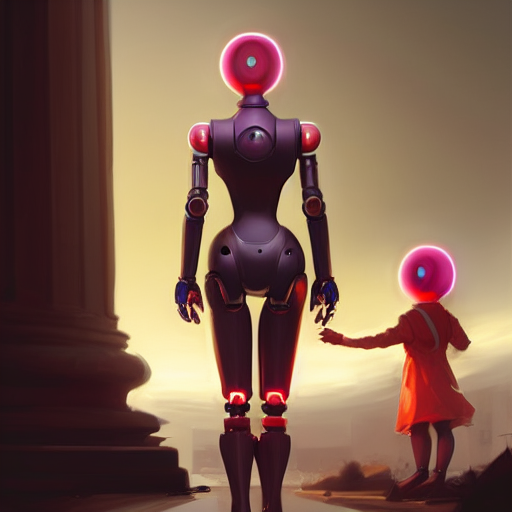

INFERENCE_SEED :  4 guidance_scale :  13 steps :  80 strength :  0.75


In [ ]:
for i in range (5):
    INFERENCE_SEED = i
    custom_generator = torch.Generator(device='cuda').manual_seed(INFERENCE_SEED)
    prompt = "Kid using IA robot working an happy in Rome,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski"
    guidance_scale = 13
    steps = 80
    strength = 0.75
    generate_image(pipe, prompt,guidance_scale= guidance_scale, steps= steps, seed=custom_generator, strength= strength , escena = "0. Marco" ,save_image=False)
    print("INFERENCE_SEED : ",INFERENCE_SEED,"guidance_scale : ",guidance_scale,"steps : ", steps, "strength : ", strength)

Roma Coliseum, futuristic buildings in Rome, full HD, 4k, 8k, realistic,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

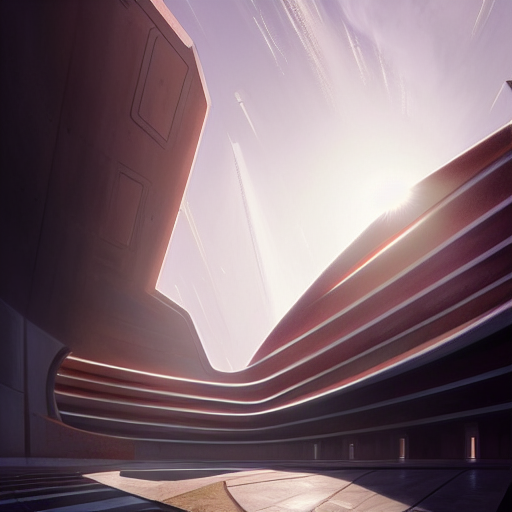

INFERENCE_SEED :  0 guidance_scale :  13 steps :  80 strength :  0.75
Roma Coliseum, futuristic buildings in Rome, full HD, 4k, 8k, realistic,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

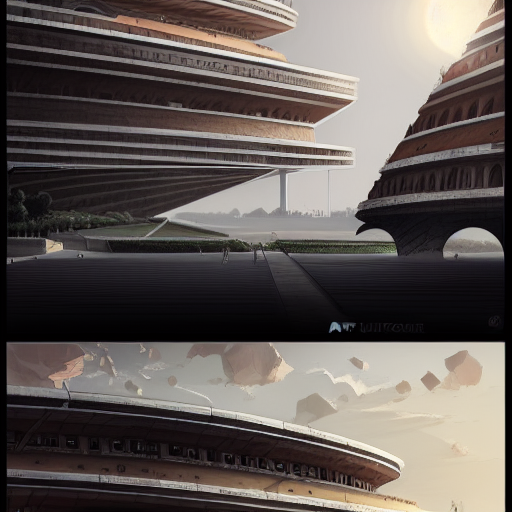

INFERENCE_SEED :  1 guidance_scale :  13 steps :  80 strength :  0.75
Roma Coliseum, futuristic buildings in Rome, full HD, 4k, 8k, realistic,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

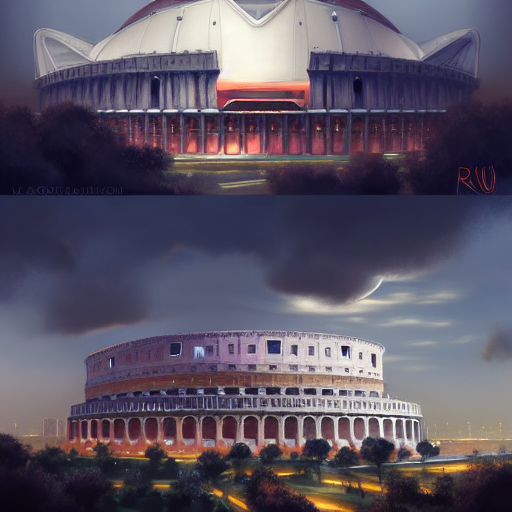

INFERENCE_SEED :  2 guidance_scale :  13 steps :  80 strength :  0.75
Roma Coliseum, futuristic buildings in Rome, full HD, 4k, 8k, realistic,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

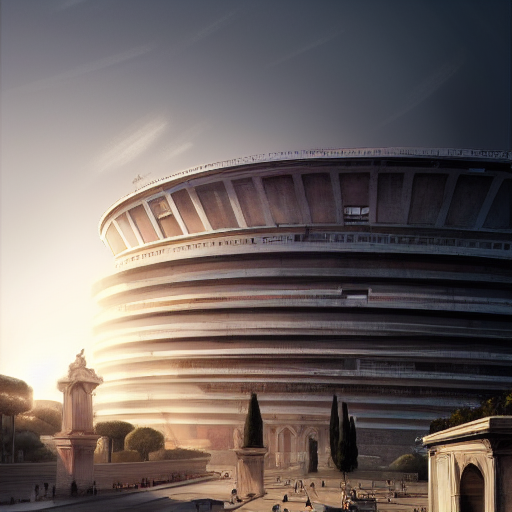

INFERENCE_SEED :  3 guidance_scale :  13 steps :  80 strength :  0.75
Roma Coliseum, futuristic buildings in Rome, full HD, 4k, 8k, realistic,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski


  0%|          | 0/80 [00:00<?, ?it/s]

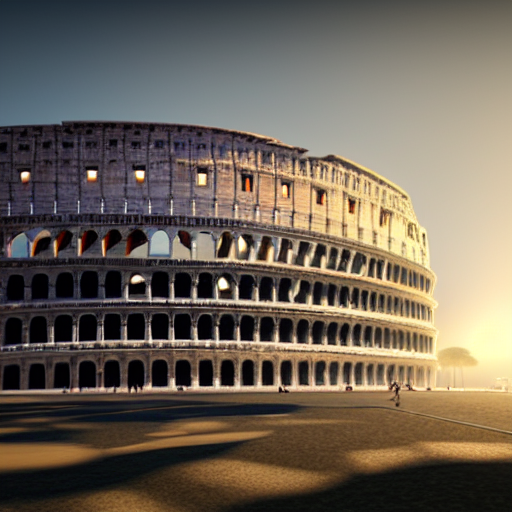

INFERENCE_SEED :  4 guidance_scale :  13 steps :  80 strength :  0.75


In [ ]:
for i in range (5):
    INFERENCE_SEED = i
    custom_generator = torch.Generator(device='cuda').manual_seed(INFERENCE_SEED)
    prompt = "Roma Coliseum, futuristic buildings in Rome, full HD, 4k, 8k, realistic,highly detailed, digital comic, artstation, concept art, smooth, sharp focus, illustration, cinematic lighting, art by artgerm and greg rutkowski"
    guidance_scale = 13
    steps = 80
    strength = 0.75
    generate_image(pipe, prompt,guidance_scale= guidance_scale, steps= steps, seed=custom_generator, strength= strength , escena = "0. Marco" ,save_image=False)
    print("INFERENCE_SEED : ",INFERENCE_SEED,"guidance_scale : ",guidance_scale,"steps : ", steps, "strength : ", strength)